## Introduction
Welcome to your first homework assignment! The goal of this assignment is to find datasets in the real world and do some basic exploratory analysis. We have found an interesting Muse EEG dataset on Kaggle that we would like you guys to explore! __Download the eeg-brainwave-dataset-mental-state.zip file and move the zip file into this folder.__

https://www.kaggle.com/birdy654/eeg-brainwave-dataset-mental-state

## About this Dataset
This is a dataset of EEG brainwave data that has been processed with our method of statistical extraction

The data was collected from four people (2 male, 2 female) for 60 seconds per state - relaxed, concentrating, neutral. We used a Muse EEG headband which recorded the TP9, AF7, AF8 and TP10 EEG placements via dry electrodes.

Our method of statistical extraction resampled the data since waves must be mathematically described in a temporal fashion.

## Exploratory Analysis

To begin this exploratory analysis, first import libraries and define functions for plotting the data using `matplotlib`. Depending on the data, not all plots will be made. (Hey, I'm just a simple kerneling bot, not a Kaggle Competitions Grandmaster!)

In [1]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

Load and Extract the Dataset

In [2]:
import zipfile
with zipfile.ZipFile("eeg-brainwave-dataset-mental-state.zip","r") as zip_ref:
    zip_ref.extractall("")

The next hidden code cells define functions for plotting data. Click on the "Code" button in the published kernel to reveal the hidden code.

In [3]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()


In [4]:
# Correlation matrix
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()


In [5]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()


Now you're ready to read in the data and use the plotting functions to visualize the data.

### Let's check what's inside mental-state.csv

In [6]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# mental-state.csv has 2360 rows in reality, but we are only loading/previewing the first 1000 rows
df1 = pd.read_csv('mental-state.csv', delimiter=',', nrows = nRowsRead)
df1.dataframeName = 'mental-state.csv'
nRow, nCol = df1.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1000 rows and 1274 columns


Let's take a quick look at what the data looks like:

In [7]:
df1.head(5)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,# mean_0,mean_1,mean_2,mean_3,mean_4,mean_d_0,mean_d_1,mean_d_2,mean_d_3,mean_d_4,...,fft_740,fft_741,fft_742,fft_743,fft_744,fft_745,fft_746,fft_747,fft_748,fft_749
28.326031,28.572133,-67.935922,24.112727,24.459813,-5.917549,3.501568,-13.027124,-1.876510,-9.986369,34.385143,27.232864,-69.626957,29.350628,29.226609,28.266057,26.420663,-53.433673,20.864484,29.673427,23.759717,27.821087,-112.281583,25.446019,11.663542,26.932492,32.758909,-37.612966,20.962702,27.064370,6.119086,0.812200,-16.193284,8.486144,-0.446818,10.625425,-0.588223,42.654625,3.904609,17.563067,7.452650,-5.526045,-32.013991,8.387926,2.162240,4.506339,-1.400423,58.847909,-4.581535,18.009885,1.333564,-6.338246,-15.820707,-0.098218,2.609058,-3.172775,-4.937823,-74.668616,4.483317,-15.400827,9.006686,4.379285,88.094093,8.066008,27.600488,-0.494735,1.323668,20.398482,-1.854958,1.827574,-607.862277,16.854646,-43197.019451,290.571026,5817.659347,3.410803e+04,1.124214e+03,2.057934e+08,1.239489e+04,1.653572e+06,-7.346121e+05,1.043254e+03,-5.169454e+09,1.264087e+05,2.835874e+07,2.777867e+07,1.067850e+05,8.566212e+12,3.704446e+06,5.681284e+09,49.813127,39.662543,152.994075,47.485647,106.078995,-9.441200,5.672111,-5.955582,-8.065415,19.318325,49.813127,32.967570,152.994075,47.485647,86.760669,39.886162,33.990431,129.229322,36.603406,83.189056,34.374571,38.282009,131.212431,39.420232,67.435501,40.371927,39.662543,147.038493,37.960223,106.078995,9.926965,-1.022861,23.764753,10.882241,3.571613,15.438556,-5.314438,21.781644,8.065415,19.325168,9.441200,-6.694973,5.955582,9.525424,-19.318325,5.511591,-4.291577,-1.983109,-2.816825,15.753555,-0.485765,-5.672111,-17.809171,-1.356817,-22.889938,-5.997356,-1.380534,-15.826062,1.460008,-38.643493,-5.080834,15.168589,-338.680711,6.538508,-42.085350,-0.330525,4.430301,36.963362,1.846016,-13.181794,18.327156,22.220544,-162.795214,16.213959,-16.095921,-4.750309,15.168589,-338.680711,6.538508,-28.903556,-5.080834,19.598890,-301.717349,8.384524,-42.085350,8.897370,26.695226,-208.295639,12.536111,-41.403970,23.077465,7.051955,175.885497,9.675451,12.807635,23.407990,2.621654,138.922135,7.829435,25.989429,9.429786,-4.474682,45.500425,3.677848,25.308049,0.330525,-4.430301,-36.963362,-1.846016,13.181794,-13.647679,-11.526637,-130.385072,-5.997603,12.500415,-13.978204,-7.096336,-93.421710,-4.151587,-0.681380,1229.026737,-373.584923,152.229968,413.485093,423.026899,172.894195,-62.039347,164.554188,-716.898678,-449.234450,173.462918,-157.809811,-373.584923,1649.576626,70.833942,41.217655,-415.190930,386.277600,-66.623685,-134.489013,3229.312129,306.840915,507.250450,-388.352779,152.229968,70.833942,288.720117,-111.774264,23.948901,389.346894,-6.886700,-11.210730,-185.699478,-1344.468203,75.190107

Distribution graphs (histogram/bar graph) of sampled columns:

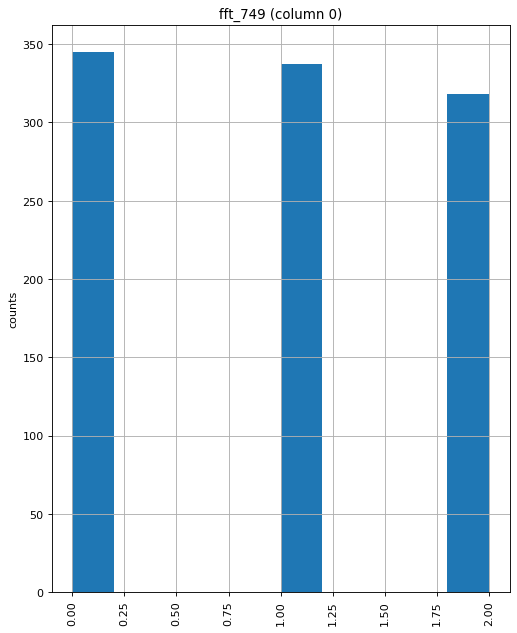

In [8]:
plotPerColumnDistribution(df1, 10, 5)

Correlation matrix:

In [14]:
plotCorrelationMatrix(df1, 317)

Scatter and density plots:

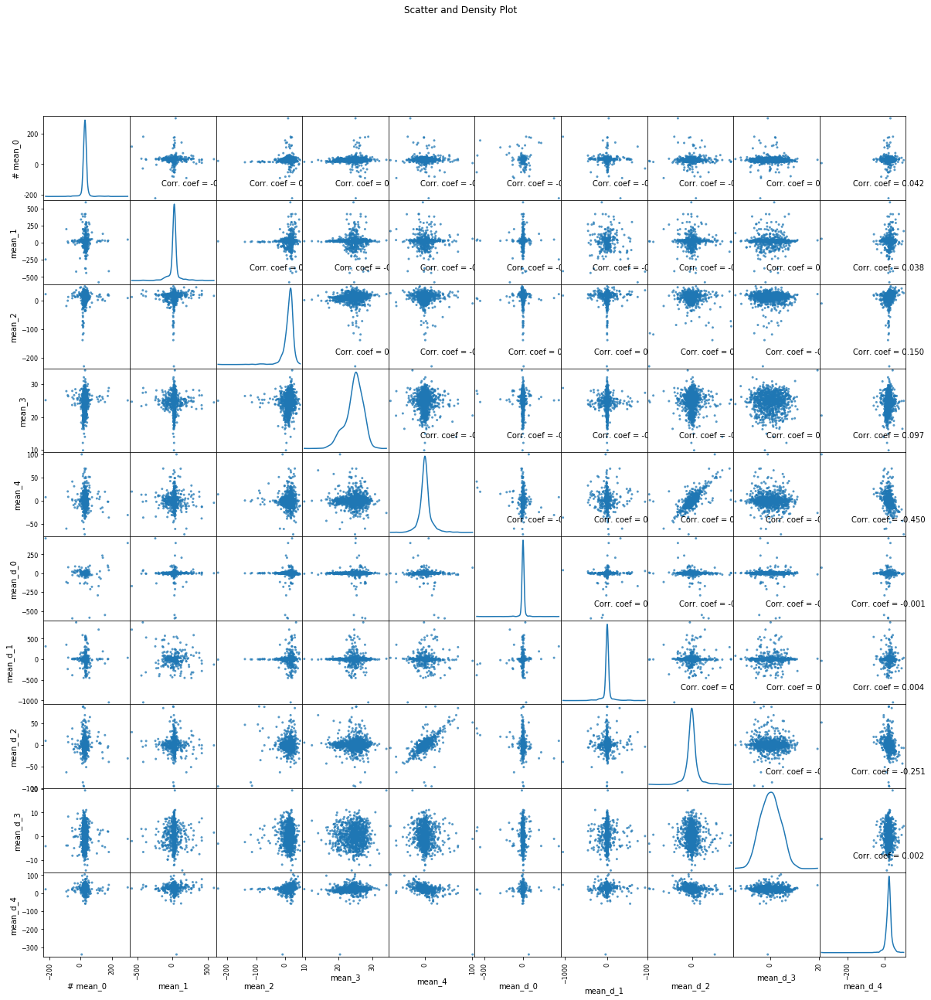

In [15]:
plotScatterMatrix(df1, 20, 10)

## Now it's your turn! Mess around with the data :)
Think about which variables show strong correlations with each other and graph those individually. Explain why you chose to graph them.

## Credits for source material

If you would like to use the data in research projects, please cite the following:

J. J. Bird, L. J. Manso, E. P. Ribiero, A. Ekart, and D. R. Faria, “A study on mental state classification using eeg-based brain-machine interface,”in 9th International Conference on Intelligent Systems, IEEE, 2018.

J. J. Bird, A. Ekart, C. D. Buckingham, and D. R. Faria, “Mental emotional sentiment classification with an eeg-based brain-machine interface,” in The International Conference on Digital Image and Signal Processing (DISP’19), Springer, 2019.

If you would like more detail on the data itself and how this process was carried out, the research paper can be found here:

http://jordanjamesbird.com/mental-state-classification-using-eeg-based-brain-machine-interface/